In [1]:
! gdown 1xANzTPNMSJjlGuswY6E5z81Vj95vkHVb

Downloading...
From: https://drive.google.com/uc?id=1xANzTPNMSJjlGuswY6E5z81Vj95vkHVb
To: /content/output_generated_data.tar
100% 2.09G/2.09G [00:20<00:00, 104MB/s]


In [ ]:
! tar -xvf output_generated_data.tar

In [1]:
import os

input_dir = 'output_generated_data'

input_img_paths = sorted(
    [
        os.path.join(input_dir, fname)
        for fname in os.listdir(input_dir)
        if fname.endswith("sample.npy")
    ]
)
target_img_paths = sorted(
    [
        os.path.join(input_dir, fname)
        for fname in os.listdir(input_dir)
        if fname.endswith("gt.npy")
    ]
)

In [2]:
import torch
import torch.nn as nn

device = torch.device('cuda')

In [3]:
class DebayerModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Conv2d(4, 16, kernel_size=(3, 3), padding='same'),
            nn.ReLU(),
            nn.Conv2d(16, 16, kernel_size=(3, 3), padding='same'),
            nn.ReLU(),
            nn.Conv2d(16, 12, kernel_size=(3, 3), padding='same'),
            nn.ReLU()
        )

    def forward(self, x):
        out = self.model(x)
        return torch.nn.functional.pixel_shuffle(out, 2)
    
debayer = DebayerModel()
debayer = torch.load('./Debayer.pt')
debayer = debayer.to(device)
debayer.eval()

DebayerModel(
  (model): Sequential(
    (0): Conv2d(4, 16, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): ReLU()
    (2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (3): ReLU()
    (4): Conv2d(16, 12, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (5): ReLU()
  )
)

In [4]:
import numpy as np

def read_bayer_image(raw):
    ch_B  = raw[1::2, 1::2]
    ch_Gb = raw[0::2, 1::2]
    ch_R  = raw[0::2, 0::2]
    ch_Gr = raw[1::2, 0::2]
    combined = np.dstack((ch_Gb, ch_R, ch_Gr,ch_B))
    return combined.astype(np.float32) / 255

In [5]:
device = torch.device('cuda')

In [ ]:
class DnCNN(nn.Module):
    def __init__(self, d=5):
        super().__init__()
        self.d = d
        self.enter = nn.Sequential(
            nn.Conv2d(3, 64, 3, padding=1),
            nn.ReLU()
        )
        self.core = []
        for i in range(d):
            self.core.append(nn.Conv2d(64, 64, 3, padding=1))
            self.core.append(nn.BatchNorm2d(64))
            self.core.append(nn.ReLU())
        self.out = nn.Conv2d(64, 3, 3, padding=1)
        self.model = nn.Sequential(self.enter, *self.core, self.out)
  
    def forward(self, x):
        return self.model(x)
    
denoise = DnCNN(20)
denoise.load_state_dict(torch.load('DnCNN.pt'))
denoise = denoise.to(device)
denoise.eval()

In [9]:
from_paths = []
with torch.inference_mode():
    for f in input_img_paths:
        sample = np.load(f, allow_pickle=True)
        sample_img = sample.item().get('image')
        bayer = read_bayer_image(sample_img)

        debayered_img = torch.tensor(bayer).permute(-1, 0, 1).to(device)
        debayered_img = debayer(debayered_img)

        den_img = denoise(debayered_img.unsqueeze(0)).squeeze()
        dbdn_img = (debayered_img - den_img)
        path = f[:-6] + '_.npy'
        np.save(path, dbdn_img.detach().cpu().numpy())
        from_paths.append(path)

In [10]:
import torch
import torch.nn
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import numpy as np

class MyDataset(Dataset):
    def __init__(self,  
            input_img_paths, 
            target_img_paths
        ):
        super().__init__()
        self.input_img_paths = input_img_paths
        self.target_img_paths = target_img_paths

    def __len__(self):
        return len(self.target_img_paths)

    def __getitem__(self, idx):
        """Returns tuple (input, target) correspond to batch #idx."""
        x = np.load(self.input_img_paths[idx])
        y = np.load(self.target_img_paths[idx], allow_pickle=True).item().get('xyz')
        return x, y

dataset = MyDataset(from_paths, target_img_paths)
dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

In [11]:
model = nn.Sequential(
        nn.Conv2d(3, 16, kernel_size=(3, 3), padding='same'),
        nn.ReLU(),
        nn.Conv2d(16, 16, kernel_size=(3, 3), padding='same'),
        nn.ReLU(),
        nn.Conv2d(16, 16, kernel_size=(3, 3), padding='same'),
        nn.ReLU(),
        nn.Conv2d(16, 3, kernel_size=(3, 3), padding='same'),
).to(device)
optimizer = torch.optim.Adam(model.parameters())

In [ ]:
model

Sequential(
  (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (1): ReLU()
  (2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (3): ReLU()
  (4): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (5): ReLU()
  (6): Conv2d(16, 3, kernel_size=(3, 3), stride=(1, 1), padding=same)
)

Epoch: 15


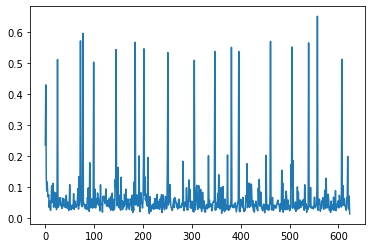

  0%|          | 0/39 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [ ]:
from tqdm.notebook import tqdm
from IPython.display import clear_output
import matplotlib.pyplot as plt

n_epochs = 100
loss_hist = []
loss_function = nn.MSELoss()

model.train()
for epoch in range(n_epochs):
    for x, y in tqdm(dataloader):
        optimizer.zero_grad()
        x, y = x.to(device), y.to(device)
        predicted = model(x)
        #print(y.shape, predicted.shape)
        loss = loss_function(y.float().permute(0,-1,1,2), predicted)
        loss_hist.append(loss.item())
        loss.backward()
        optimizer.step()

    clear_output(wait=True)
    print('Epoch:', epoch)
    plt.plot(loss_hist)
    plt.show()

In [ ]:
x[0].permute(1,2,0).shape

torch.Size([512, 512, 3])

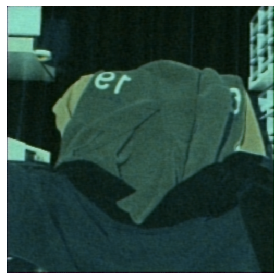

(<Figure size 432x288 with 1 Axes>, <Axes: >)

In [ ]:
import colour

x, y_true = next(iter(dataloader))
with torch.inference_mode():
    pred = model(x.to(device)).detach().cpu()

colour.plotting.plot_image(x[0].permute(1,2,0))

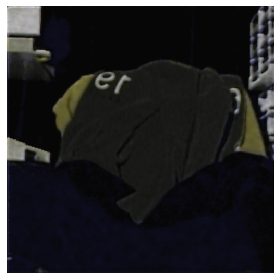

(<Figure size 432x288 with 1 Axes>, <Axes: >)

In [ ]:
colour.plotting.plot_image(pred[0].permute(1,2,0))

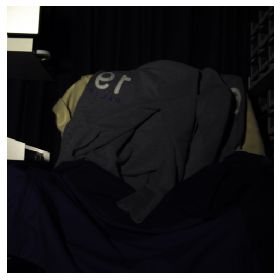

(<Figure size 432x288 with 1 Axes>, <Axes: >)

In [ ]:
colour.plotting.plot_image(y_true[0])

In [ ]:
torch.save(model.state_dict(), 'CST.pt')

In [ ]:
import numpy as np
import warnings


class XYZ_TO_SRGB:
    def __init__(self, LIN_RGB_MATRIX=None):
        if LIN_RGB_MATRIX is not None:
            self.LIN_RGB_MATRIX = LIN_RGB_MATRIX
        else:
            self.LIN_RGB_MATRIX = np.array(
                [
                    [3.2404542, -1.5371385, -0.4985314],
                    [-0.9692660, 1.8760108, 0.0415560],
                    [0.0556434, -0.2040259, 1.0572252],
                ]
            )

    def _XYZ_to_linRGB(self, xyz):
        xyz = np.array(xyz)
        return xyz @ self.LIN_RGB_MATRIX.T

    def _linRGB2sRGB(self, img):
        """
        img: float32 image [0, 1]
        """
        if img.dtype != np.float32:
            warnings.warn("ffs, use float32 not %s" % img.dtype)
        if img.min() < 0 or img.max() > 1:
            warnings.warn(
                "ffs, the range should be in [0, 1] not [%f %f]" % (img.min(), img.max())
            )

        thres = 0.0031308
        a = 0.055

        img = np.clip(img, 0, 1)

        for y in range(0, img.shape[0], 64):
            for x in range(0, img.shape[1], 64):
                s = slice(y, y + 64), slice(x, x + 64)
                fragment = img[s]
                low = fragment <= thres

                fragment[low] *= 12.92
                fragment[~low] = (1 + a) * fragment[~low] ** (1 / 2.4) - a

        return img

    def XYZ_to_sRGB(self, xyz):
        lin = self._XYZ_to_linRGB(xyz)
        return self._linRGB2sRGB(lin)

<ipython-input-15-f1858b046232>:27: UserWarning: ffs, use float32 not float64
  warnings.warn("ffs, use float32 not %s" % img.dtype)
<ipython-input-15-f1858b046232>:29: UserWarning: ffs, the range should be in [0, 1] not [-0.116145 1.043547]
  warnings.warn(


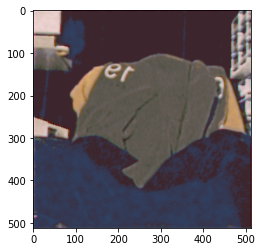

In [ ]:
SRGB = XYZ_TO_SRGB()
plt.imshow(SRGB.XYZ_to_sRGB(pred[0].permute(1,2,0)))

<ipython-input-15-f1858b046232>:27: UserWarning: ffs, use float32 not float64
  warnings.warn("ffs, use float32 not %s" % img.dtype)
<ipython-input-15-f1858b046232>:29: UserWarning: ffs, the range should be in [0, 1] not [0.001610 1.223214]
  warnings.warn(


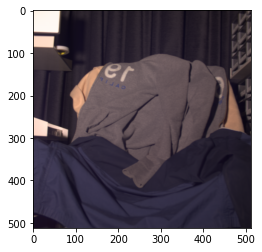

In [ ]:
plt.imshow(SRGB.XYZ_to_sRGB(y_true[0].cpu()))

In [16]:
for i, (x, y) in enumerate(dataset):
    pred = model(torch.tensor(x).unsqueeze(0).to(device)).detach().cpu().squeeze()
    pred = SRGB.XYZ_to_sRGB(torch.clip(pred.permute(1,2,0), 0, 1))
    true_ = SRGB.XYZ_to_sRGB(torch.clip(torch.tensor(y), 0, 1))
    
    np.save(f"white/{i}_sample.npy", pred)
    np.save(f"white/{i}_target.npy", true_)

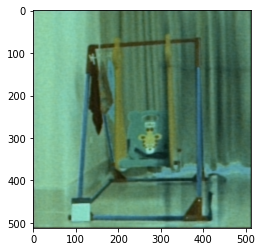

In [ ]:
plt.imshow(dataset[0][0].transpose(1,2,0))

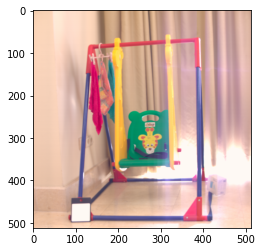

In [ ]:
plt.imshow(dataset[0][1])

In [1]:
import os

input_dir = 'white'
input_img_paths = sorted(
    [
        os.path.join(input_dir, fname)
        for fname in os.listdir(input_dir)
        if fname.endswith("sample.npy")
    ]
)
target_img_paths = sorted(
    [
        os.path.join(input_dir, fname)
        for fname in os.listdir(input_dir)
        if not fname.endswith("sample.npy")
    ]
)

In [2]:
len(input_img_paths), len(target_img_paths)

(306, 306)

In [3]:
from torch.utils.data import Dataset, DataLoader
import numpy as np

class MyDataset(Dataset):
    def __init__(self,  
            input_img_paths, 
            target_img_paths
        ):
        super().__init__()
        self.input_img_paths = input_img_paths
        self.target_img_paths = target_img_paths

    def __len__(self):
        return len(self.target_img_paths)

    def __getitem__(self, idx):
        """Returns tuple (input, target) correspond to batch #idx."""
        x = torch.tensor(np.load(self.input_img_paths[idx])).float()
        y = torch.tensor(np.load(self.target_img_paths[idx])).float()
        return x, y

dataset = MyDataset(input_img_paths, target_img_paths)
dataloader = DataLoader(dataset, batch_size=4, shuffle=True)

In [34]:
import torch
import torch.nn as nn

device = torch.device('cuda')

model = nn.Sequential(
        nn.Conv2d(3, 8, kernel_size=(3, 3), padding='same'),
        nn.ReLU(),
        nn.Conv2d(8, 8, kernel_size=(3, 3), padding='same'),
        nn.ReLU(),
        nn.Conv2d(8, 8, kernel_size=(3, 3), padding='same'),
        nn.ReLU(),
        nn.Flatten(),
        nn.LazyLinear(128),
        nn.ReLU(),
        nn.Linear(128, 3),
        nn.Tanh()
).to(device)

optimizer = torch.optim.Adam(model.parameters(), weight_decay=1e-2)

Epoch: 3
tensor([[1., 1., 1.],
        [1., 1., 1.]], device='cuda:0', grad_fn=<SqueezeBackward0>)


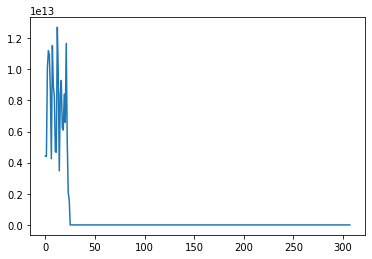

  0%|          | 0/77 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [36]:
from tqdm.notebook import tqdm
from IPython.display import clear_output
import matplotlib.pyplot as plt

n_epochs = 20
loss_hist = []
eps = 1e-7
loss_function = nn.MSELoss()

model.train()
for epoch in range(n_epochs):
    for x, y in tqdm(dataloader):
        optimizer.zero_grad()
        x, y = x.to(device), y.to(device)
        x = x.permute(0, -1, 1,2)
        predicted = model(x).unsqueeze(-1).unsqueeze(-1)
        #print(predicted)
        #print(y.shape, predicted.shape)
        #print(x.shape, y.shape, predicted.shape)
        loss = loss_function(y.permute(0,-1,1,2).float(), x / (predicted + 1 + eps))
        loss_hist.append(loss.item())
        loss.backward()
        optimizer.step()

    clear_output(wait=True)
    print('Epoch:', epoch)
    print(predicted.squeeze())
    #print(y.max(), y.min())
    plt.plot(loss_hist)
    plt.show()

In [12]:
! pip install colour-science

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 18.7 MB/s eta 0:00:00


torch.Size([8, 512, 512, 3])


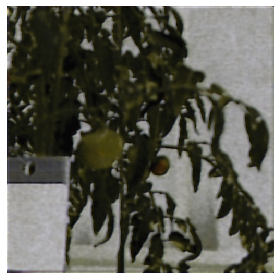

(<Figure size 432x288 with 1 Axes>, <Axes: >)

In [14]:
import colour

x, y_true = next(iter(dataloader))
with torch.inference_mode():
    pred = model(x.to(device).permute(0,-1,1,2)).detach().cpu()
    pred = pred.unsqueeze(1).unsqueeze(1)
    x_pred = x / pred

print(x.shape)
colour.plotting.plot_image(x[0])

In [17]:
pred

tensor([[[[-4433.1279, -2811.6155, -2837.1704]]],


        [[[-4514.9937, -2886.6826, -2914.1003]]],


        [[[-4320.8403, -2672.5054, -2696.4460]]],


        [[[-4438.7886, -2702.2371, -2728.2000]]],


        [[[-4210.0142, -2731.5691, -2754.9214]]],


        [[[-4284.4028, -2673.7341, -2697.6970]]],


        [[[-4247.8525, -2563.5193, -2586.9009]]],


        [[[-4383.4941, -2852.6350, -2878.3472]]]])

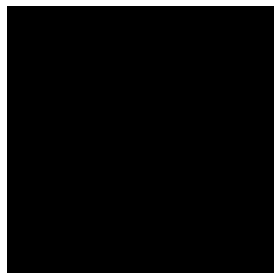

(<Figure size 432x288 with 1 Axes>, <Axes: >)

In [16]:
colour.plotting.plot_image(torch.clip(x_pred[0], 0, 1))

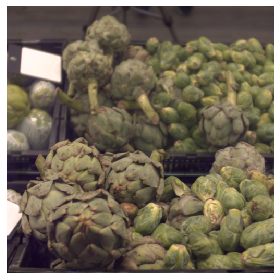

(<Figure size 432x288 with 1 Axes>, <Axes: >)

In [ ]:
colour.plotting.plot_image(y_true[0])

In [ ]:
torch.save(model.state_dict(), open('Balance.nty', 'wb'))

## Дебайеринг

In [ ]:
! unzip bayer_canon.zip

In [ ]:
! pip install colour-science

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 30.1 MB/s eta 0:00:00


In [ ]:
import torch
import torch.nn as nn

device = torch.device('cuda' if torch.cuda.is_available else 'cpu')
device

device(type='cuda')

In [ ]:
import colour
import imageio

def read_target_image(path: str, size):
    image = colour.io.read_image(path)[:,:,:3]
    return image.astype(np.float32)


def read_bayer_image(path: str):
    raw = np.asarray(imageio.imread(path))
    if raw is None:
        raise Exception(f'Can not read image {path}')
    ch_B  = raw[1::2, 1::2]
    ch_Gb = raw[0::2, 1::2]
    ch_R  = raw[0::2, 0::2]
    ch_Gr = raw[1::2, 0::2]
    combined = np.dstack((ch_B, ch_Gb, ch_R, ch_Gr))
    return combined.astype(np.float32) / (4 * 255) / 64

In [ ]:
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import numpy as np

class RawLoader(Dataset):
    """Helper to iterate over the data"""

    def __init__(self,  
            img_size, 
            dslr_scale, 
            input_img_paths, 
            target_img_paths
        ):
        self.original_img_size = img_size

        if img_size[0] % 2 != 0:
            img_size = (img_size[0] - 1, img_size[1])
        if img_size[1] % 2 != 0:
            img_size = (img_size[0], img_size[1] - 1)
        self.img_size = img_size
        self.dslr_scale = dslr_scale
        self.input_img_paths = input_img_paths
        self.target_img_paths = target_img_paths

    def __len__(self):
        return len(self.target_img_paths)

    def __getitem__(self, idx):
        """Returns tuple (input, target) correspond to batch #idx."""
        input_img_path = self.input_img_paths[idx]
        target_img_path = self.target_img_paths[idx]
        dslr_size = (self.img_size[0] * self.dslr_scale, self.img_size[1] * self.dslr_scale)
    

        x = torch.tensor(read_bayer_image(input_img_path)[:self.img_size[0],:self.img_size[1], :4], dtype=torch.float32).permute(-1, 0, 1)
        dslr_size_ = (self.original_img_size[0] * self.dslr_scale, self.original_img_size[1] * self.dslr_scale)
        img = read_target_image(target_img_path, dslr_size_)
        y = torch.tensor(img[:dslr_size[0],:dslr_size[1],:3], dtype=torch.float32).permute(-1, 0, 1)
        
        return x, y

In [ ]:
import random
import os

base_dir = "bayer_canon/"

raw_shape = colour.io.read_image(base_dir + 'input/1.png').shape
raw_shape = (int(raw_shape[0] / 2), int(raw_shape[1] / 2))

print(raw_shape)

train_input_dir = os.path.join(base_dir, "input")
train_target_dir = os.path.join(base_dir, "groundtruth")
img_size = raw_shape
dlsr_scale = 2
input_channels = 4
output_channels = 3
batch_size = 8

input_img_paths = sorted(
    [
        os.path.join(train_input_dir, fname)
        for fname in os.listdir(train_input_dir)
        if fname.endswith(".png")
    ]
)
target_img_paths = sorted(
    [
        os.path.join(train_target_dir, fname)
        for fname in os.listdir(train_target_dir)
        if fname.endswith(".png")
    ]
)


for input_path, target_path in zip(input_img_paths[:10], target_img_paths[:10]):
    print(os.path.basename(input_path), "|", os.path.basename(target_path))
    
val_samples = 8
random.Random(42).shuffle(input_img_paths)
random.Random(42).shuffle(target_img_paths)
train_input_img_paths = input_img_paths[:-val_samples]
train_target_img_paths = target_img_paths[:-val_samples]
val_input_img_paths = input_img_paths[-val_samples:]
val_target_img_paths = target_img_paths[-val_samples:]

# Instantiate data Sequences for each split
train_gen = RawLoader(
    img_size, dlsr_scale, train_input_img_paths, train_target_img_paths
)
val_gen = RawLoader(
    img_size, dlsr_scale, val_input_img_paths, val_target_img_paths
)

print("Number of samples:", len(input_img_paths))

(105, 159)
1.png | 1.png
10.png | 10.png
11.png | 11.png
12.png | 12.png
13.png | 13.png
14.png | 14.png
15.png | 15.png
16.png | 16.png
17.png | 17.png
18.png | 18.png
Number of samples: 57


/root/.local/lib/python3.9/site-packages/colour/utilities/verbose.py:266: ColourUsageWarning: "OpenImageIO" related API features are not available, switching to "Imageio"!
  warn(*args, **kwargs)


In [ ]:
train_loader = DataLoader(train_gen, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_gen, batch_size=batch_size, shuffle=False)

In [ ]:
next(iter(val_loader))[0].shape, next(iter(val_loader))[1].shape

<ipython-input-2-507de93382fb>:10: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  raw = np.asarray(imageio.imread(path))


(torch.Size([8, 4, 104, 158]), torch.Size([8, 3, 208, 316]))

In [ ]:
from torch.optim import SGD, Adam

class DebayerModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Conv2d(4, 16, kernel_size=(3, 3), padding='same'),
            nn.ReLU(),
            nn.Conv2d(16, 16, kernel_size=(3, 3), padding='same'),
            nn.ReLU(),
            nn.Conv2d(16, 12, kernel_size=(3, 3), padding='same'),
            nn.ReLU()
        )

    def forward(self, x):
        out = self.model(x)
        return torch.nn.functional.pixel_shuffle(out, 2)


debayer_model = DebayerModel().to(device)
optimizer = Adam(debayer_model.parameters(), lr=1e-3)
loss_function = nn.L1Loss()

Epoch: 149


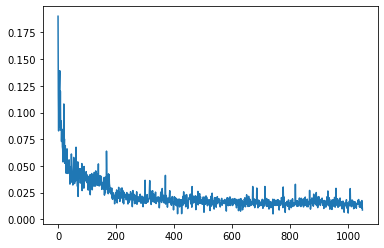

In [ ]:
from tqdm.notebook import tqdm
from IPython.display import clear_output
import matplotlib.pyplot as plt

n_epochs = 150
loss_hist = []

debayer_model.train()
for epoch in range(n_epochs):
    for x, y in tqdm(train_loader):
        optimizer.zero_grad()
        x, y = x.to(device), y.to(device)
        predicted = debayer_model(x)
        loss = loss_function(y, predicted)
        loss_hist.append(loss.item())
        loss.backward()
        optimizer.step()

    clear_output(wait=True)
    print('Epoch:', epoch)
    plt.plot(loss_hist)
    plt.show()

In [ ]:
import torch.nn.functional as F
from torch.autograd import Variable
import numpy as np
from math import exp

def gaussian(window_size, sigma):
    gauss = torch.Tensor([exp(-(x - window_size//2)**2/float(2*sigma**2)) for x in range(window_size)])
    return gauss/gauss.sum()

def create_window(window_size, channel):
    _1D_window = gaussian(window_size, 1.5).unsqueeze(1)
    _2D_window = _1D_window.mm(_1D_window.t()).float().unsqueeze(0).unsqueeze(0)
    window = Variable(_2D_window.expand(channel, 1, window_size, window_size).contiguous())
    return window

def _ssim(img1, img2, window, window_size, channel, size_average = True):
    mu1 = F.conv2d(img1, window, padding = window_size//2, groups = channel)
    mu2 = F.conv2d(img2, window, padding = window_size//2, groups = channel)

    mu1_sq = mu1.pow(2)
    mu2_sq = mu2.pow(2)
    mu1_mu2 = mu1*mu2

    sigma1_sq = F.conv2d(img1*img1, window, padding = window_size//2, groups = channel) - mu1_sq
    sigma2_sq = F.conv2d(img2*img2, window, padding = window_size//2, groups = channel) - mu2_sq
    sigma12 = F.conv2d(img1*img2, window, padding = window_size//2, groups = channel) - mu1_mu2

    C1 = 0.01**2
    C2 = 0.03**2

    ssim_map = ((2*mu1_mu2 + C1)*(2*sigma12 + C2))/((mu1_sq + mu2_sq + C1)*(sigma1_sq + sigma2_sq + C2))

    if size_average:
        return ssim_map.mean()
    else:
        return ssim_map.mean(1).mean(1).mean(1)

def SSIM(img1, img2, window_size = 11, size_average = True):
    (_, channel, _, _) = img1.size()
    window = create_window(window_size, channel)
    
    if img1.is_cuda:
        window = window.cuda(img1.get_device())
    window = window.type_as(img1)
    
    return _ssim(img1, img2, window, window_size, channel, size_average)

def PSNR(predicted, target):
    mse = F.mse_loss(predicted, target)
    mx = 255 * 255.0
    return 10 * torch.log10(mx / mse)

In [ ]:
debayer_model.eval()
with torch.inference_mode():
    psnr = 0
    ssim = 0
    n = 0
    for x, y in tqdm(val_loader):
        x = x.to(device)
        predicted = debayer_model(x)
        n += predicted.shape[0] 
        for pred, y_ in zip(predicted, y):
            psnr += PSNR(y_, pred.detach().cpu())
        ssim += SSIM(y, predicted.detach().cpu())

print()
print(f"Mean PSNR: {psnr / n}, mean SSIM: {ssim}")

  0%|          | 0/1 [00:00<?, ?it/s]

<ipython-input-2-507de93382fb>:10: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  raw = np.asarray(imageio.imread(path))



Mean PSNR: 81.97102355957031, mean SSIM: 0.9407633543014526


In [ ]:
next(iter(val_loader))[0].shape, next(iter(val_loader))[1].shape

<ipython-input-2-507de93382fb>:10: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  raw = np.asarray(imageio.imread(path))
/root/.local/lib/python3.9/site-packages/colour/utilities/verbose.py:266: ColourUsageWarning: "OpenImageIO" related API features are not available, switching to "Imageio"!
  warn(*args, **kwargs)


(torch.Size([8, 4, 104, 158]), torch.Size([8, 3, 208, 316]))

<ipython-input-2-507de93382fb>:10: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  raw = np.asarray(imageio.imread(path))
/root/.local/lib/python3.9/site-packages/colour/utilities/verbose.py:266: ColourUsageWarning: "OpenImageIO" related API features are not available, switching to "Imageio"!
  warn(*args, **kwargs)


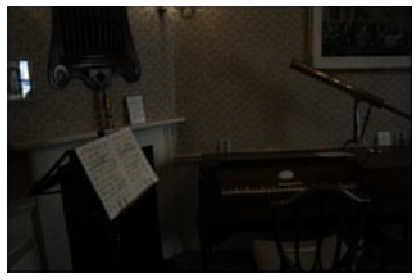

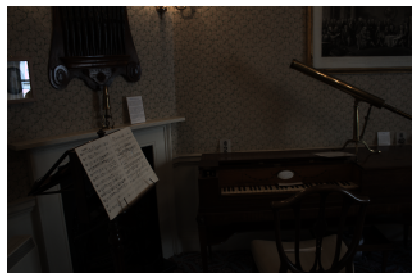

((<Figure size 432x288 with 1 Axes>, <Axes: >),
 (<Figure size 432x288 with 1 Axes>, <Axes: >))

In [ ]:
x, y_true = next(iter(val_loader))
with torch.inference_mode():
    pred = debayer_model(x.to(device)).detach().cpu()

colour.plotting.plot_image(pred[0].permute(1,2,0)), colour.plotting.plot_image(y_true[0].permute(1,2,0))

In [ ]:
torch.save(debayer_model, 'Debayer.pt')

## Денойзинг

In [ ]:
!wget http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar
!tar -xvf images.tar
!mkdir dataset_dogs

In [ ]:
import os
import shutil
from PIL import Image
path = 'Images'
directory = os.fsencode(path)

for file in os.listdir(directory):
    dirname = path + os.sep + str(os.fsdecode(file))
    for photo in os.listdir(os.fsencode(dirname)):
        pname = os.fsdecode(photo)
        full_path = dirname + os.sep + pname
        shutil.copyfile(full_path, 'dataset_dogs' + os.sep + pname) 

In [ ]:
import os
from PIL import Image
import numpy as np

path = 'dataset_dogs'
dirname = os.fsencode(path)

noisy_images = []
clean_images = []

for photo in os.listdir(os.fsencode(dirname)):
    pname = os.fsdecode(photo)
    full_path = path + os.sep + pname
    img = Image.open(full_path)
    clean_images.append(img)

In [ ]:
import torch
import torch.nn as nn

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available else 'cpu')
device

device(type='cuda')

In [ ]:
from torch.nn.modules.batchnorm import BatchNorm2d

class DnCNN(nn.Module):
    def __init__(self, d=5):
        super().__init__()
        self.d = d
        self.enter = nn.Sequential(
            nn.Conv2d(3, 64, 3, padding=1),
            nn.ReLU()
        )
        self.core = []
        for i in range(d):
            self.core.append(nn.Conv2d(64, 64, 3, padding=1))
            self.core.append(nn.BatchNorm2d(64))
            self.core.append(nn.ReLU())
        self.out = nn.Conv2d(64, 3, 3, padding=1)
        self.model = nn.Sequential(self.enter, *self.core, self.out)
  
    def forward(self, x):
        return self.model(x)

In [ ]:
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader

tr = transforms.Compose([
  transforms.ToTensor(),
  transforms.RandomCrop(100),
  transforms.Normalize((0.5, 0.5, 0.5),
                      (0.5, 0.5, 0.5)),]
)

tr_eval = transforms.Compose([
  transforms.ToTensor(),
  transforms.Normalize((0.5, 0.5, 0.5),
                      (0.5, 0.5, 0.5)),
])

class MyDataset(Dataset):
    def __init__(self, trans, clean):
        self.trans = trans
        self.clean = clean
    def __len__(self):
        return len(self.clean)
    def __getitem__(self, idx):
        return self.trans(self.clean[idx])

In [ ]:
def init_kaiming(layer):
    if isinstance(layer, nn.Conv2d):
        nn.init.kaiming_normal_(layer.weight, mode='fan_in')
    elif isinstance(layer, nn.BatchNorm2d):
        layer.bias.data.fill_(0.0)
        nn.init.normal_(layer.weight, 0, 0.01)
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

In [ ]:
! pip install torchmetrics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from IPython.display import clear_output
from torch.optim import SGD, Adam
from torch.optim.lr_scheduler import StepLR, OneCycleLR
from tqdm import tqdm, trange
import matplotlib.pyplot as plt
import torchmetrics.functional as tmf

Epoch: 2 lr: 0.001


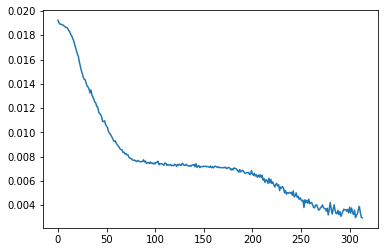

100%|██████████| 157/157 [01:10<00:00,  2.22it/s]


In [ ]:
sigma = 35

net = DnCNN(20).to(device)
net.apply(init_kaiming)
dataset = MyDataset(tr, clean_images[:5000])
optimizer = Adam(net.parameters(), lr=0.001)

n_epochs = 3
loss_hist = []

loader = DataLoader(dataset, batch_size=32, shuffle=True)

net.train()
for epoch in range(n_epochs):
    clear_output(wait=True)
    print('Epoch:', epoch, 'lr:', get_lr(optimizer))
    plt.plot(loss_hist)
    plt.show()
    for clean in tqdm(loader):
        if clean.shape[1] != 3:
            continue
        noise =  torch.FloatTensor(clean.shape).normal_(0, std=sigma / 255)
        noisy = clean + noise
        optimizer.zero_grad()
        n = noisy.to(device)
        c = clean.to(device)
        predicted_noise = net(n)
        loss = nn.MSELoss()(noise.to(device), predicted_noise)
        loss_hist.append(loss.item())
        loss.backward()
        optimizer.step()

In [ ]:
dataset_eval = MyDataset(tr_eval, clean_images[5000:5500])

r_tr = transforms.Compose([
    transforms.Normalize(0, 2),
    transforms.Normalize(-0.5, 1),
    transforms.ToPILImage()
])
def get_concat_h(im1, im2): # Взял https://note.nkmk.me/en/python-pillow-concat-images/
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

def compare(clean, model):
    noise =  torch.FloatTensor(clean.shape).normal_(0, std=sigma / 255)
    print(noise.shape)
    noisy = (clean + noise).to(device)
    predicted_noise = model(noisy.unsqueeze(0).to(device))[0]
    predicted_clean = noisy - predicted_noise
    return clean, noisy, predicted_clean, predicted_noise

def get_panel(clean, model):
    c, n, p, ns = compare(clean, model)
    clean_img = r_tr(torch.clamp(c, -1, 1))# Image.fromarray((c.detach().cpu().numpy().transpose((1, 2, 0)) * 127.5 + 127.5).astype(np.uint8))
    noisy_img = r_tr(torch.clamp(n, -1, 1))# Image.fromarray((n.detach().cpu().numpy().transpose((1, 2, 0)) * 127.5 + 127.5).astype(np.uint8))
    predc_img = r_tr(torch.clamp(p, -1, 1))# Image.fromarray((p.detach().cpu().numpy().transpose((1, 2, 0)) * 127.5 + 127.5).astype(np.uint8))
    ns_img = r_tr(torch.clamp(ns, -1, 1))
    return get_concat_h(clean_img, get_concat_h(noisy_img, get_concat_h(predc_img, ns_img)))

torch.Size([3, 360, 480])


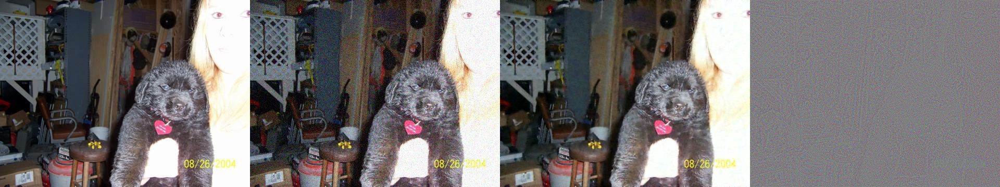

In [ ]:
net.eval()
get_panel(dataset_eval[0], net)

torch.Size([3, 423, 500])


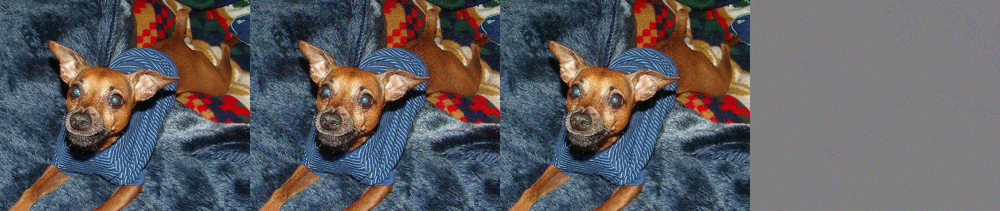

In [ ]:
get_panel(dataset_eval[1], net)

torch.Size([3, 375, 500])


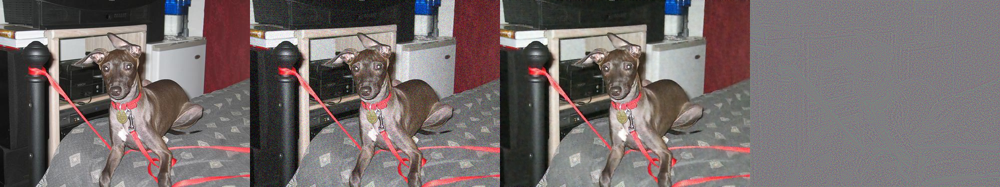

In [ ]:
get_panel(dataset_eval[2], net)

torch.Size([3, 182, 199])


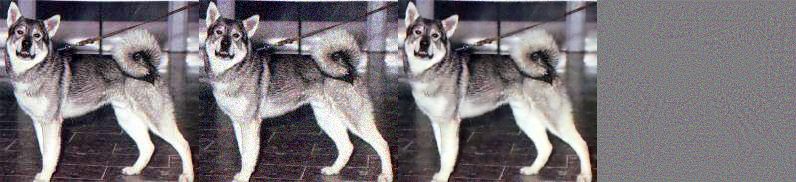

In [ ]:
get_panel(dataset_eval[3], net)

In [ ]:
torch.save(net.state_dict(), 'DnCNN.pt')

## Баланс белого

In [ ]:
! wget https://zenodo.org/record/4153431/files/SimpleCube++.zip

--2023-03-27 16:36:50--  https://zenodo.org/record/4153431/files/SimpleCube++.zip
Resolving zenodo.org (zenodo.org)... 188.185.124.72
Connecting to zenodo.org (zenodo.org)|188.185.124.72|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2113441199 (2.0G) [application/octet-stream]
Saving to: ‘SimpleCube++.zip’

SimpleCube++.zip    100%[===================>]   1.97G  2.53MB/s    in 17m 24s 

2023-03-27 16:54:16 (1.93 MB/s) - ‘SimpleCube++.zip’ saved [2113441199/2113441199]



In [ ]:
! unzip SimpleCube++.zip

In [ ]:
def angular_error(gt, pred):
    '''Angular Error between two vectors.'''
    v1 = np.array(gt) / np.linalg.norm(gt, ord=2)
    v2 = np.array(pred) / np.linalg.norm(pred, ord=2)
    return np.arccos((v1*v2).sum().clip(-1, 1)) / np.pi * 180

def repr_ang_error(gt, pred):
    """Calc reproduction angular error. See "Finlayson, Graham D., and Roshanak Zakizadeh. Reproduction angular
        error: An improved performance metric for illuminant estimation." 
    In the IEC#1 arguments order was mistakenly swapped. It slightly changed metric values within the same competitors' solutions order. 
    """
    err = angular_error([1, 1, 1], gt / pred)
    return err

In [ ]:
import os
import warnings
warnings.filterwarnings('ignore')
import torch
import cv2
import torch.nn as nn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader

# Dataset preparation:
class CubePPDataset(Dataset):
    def __init__(self, root_dir, csv_file):
        self.images_frame = pd.read_csv(csv_file)
        self.root_dir = root_dir
        
    def __len__(self):
        return len(self.images_frame)

    def __getitem__(self, idx):
        img_name = os.path.join(self.root_dir,
                                self.images_frame.iloc[idx, 0])
        image = cv2.imread(img_name + '.png')
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = image.astype(np.float32)
        image = image / 255.0
        image = cv2.resize(image, (96, 96))
        light_source = self.images_frame.iloc[idx, 1:]
        image = torch.tensor(image).permute(-1, 0, 1)
            
        return image, torch.from_numpy(light_source.to_numpy(dtype=np.float32))


path_to_train = 'SimpleCube++/train/'
path_to_test = 'SimpleCube++/test/'

train_gen_dataset = CubePPDataset(
    'SimpleCube++/train/PNG', 
    'SimpleCube++/train/gt.csv'
)
train_gen_loader = DataLoader(train_gen_dataset, batch_size=32, shuffle=True)

test_gen_dataset = CubePPDataset(
    'SimpleCube++/test/PNG', 
    'SimpleCube++/test/gt.csv'
)
test_gen_loader = DataLoader(test_gen_dataset, batch_size=32, shuffle=False)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [ ]:
! unzip BalanceCNN.pt.zip

Archive:  BalanceCNN.pt.zip
  inflating: BalanceCNN.pt           
  inflating: __MACOSX/._BalanceCNN.pt  


In [ ]:
from torch.optim import Adam
from IPython.display import clear_output
from tqdm.notebook import tqdm

balanced_model = nn.Sequential(
    nn.Conv2d(3, 64, kernel_size=(3, 3), padding='same'),
    nn.ReLU(),
    nn.BatchNorm2d(64),
    nn.Conv2d(64, 64, kernel_size=(3, 3), padding='same'),
    nn.ReLU(),
    nn.BatchNorm2d(64),
    nn.Conv2d(64, 64, kernel_size=(3, 3), padding='same'),
    nn.Flatten(),
    nn.LazyLinear(128),
    nn.ReLU(),
    nn.BatchNorm1d(128),
    nn.Linear(128, 3)
).to(device)
balanced_model.load_state_dict(torch.load('BalanceCNN.pt'))

/usr/local/lib/python3.9/dist-packages/torch/nn/modules/lazy.py:180: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


<All keys matched successfully>

In [ ]:
loss_function = nn.MSELoss()
optimizer = Adam(balanced_model.parameters())
n_epochs = 5
loss_hist=[]

balanced_model.train()
for epoch in range(n_epochs):
    for x, y in tqdm(train_gen_loader):
        optimizer.zero_grad()
        x, y = x.to(device), y.to(device)
        predicted = balanced_model(x)
        loss = loss_function(predicted, y)
        loss_hist.append(loss.item())
        loss.backward()
        optimizer.step()
    clear_output(wait=True)
    print('Epoch:', epoch)
    plt.plot(loss_hist)
    plt.show()

  0%|          | 0/56 [00:00<?, ?it/s]

OutOfMemoryError: ignored

In [ ]:
balanced_model.eval()
with torch.inference_mode():
    ang_error = 0
    repr_error = 0
    n = 0
    for x, y in tqdm(test_gen_loader):
        x = x.to(device)
        predicted = balanced_model(x)
        n += predicted.shape[0]
        for y_true, y_pred in zip(y, predicted):
            ang_error += angular_error(y_true, y_pred.detach().cpu().numpy())
            repr_error += repr_ang_error(y_true, y_pred.detach().cpu().numpy())

print()
print(f"Mean angular error: {ang_error / n}, mean repr_ang error: {repr_error / n}")

  0%|          | 0/15 [00:00<?, ?it/s]


Mean angular error: 5.39854345029433, mean repr_ang error: 7.798882604826102


In [ ]:
torch.save(balanced_model.state_dict(), 'BalanceCNN.pt')

In [ ]:
torch.load_state_dict()

In [ ]:
with torch.inference_mode():
    for x, y in tqdm(dataloader):
        x_ = nn.functional.interpolate(x, 96)
        x_, y = x_.to(device), y.to(device)
        predicted = balanced_model(x_)
        break

  0%|          | 0/39 [00:00<?, ?it/s]

In [ ]:
x_[0].detach().cpu().permute(1,2,0).shape

torch.Size([96, 96, 3])

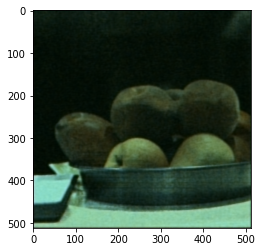

In [ ]:
import colour 

plt.imshow(x[3].detach().cpu().permute(1,2,0))

In [ ]:
predicted

tensor([[-0.2350,  0.8772,  1.5437],
        [-0.0878,  0.0084, -0.2075],
        [ 0.7577, -0.2602, -0.0781],
        [-0.2796,  2.3907,  1.1075],
        [ 0.4026, -0.6852, -0.3093],
        [ 0.2352,  0.1037, -0.2278],
        [ 0.1465,  1.4437,  0.6914],
        [ 0.8710, -0.1471, -0.0690]], device='cuda:0')

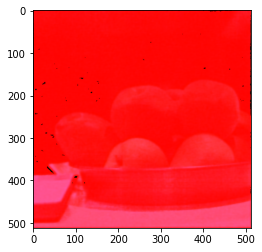

In [ ]:
def linearize(img, black_lvl=2048, saturation_lvl=2**14-1):
    """
    :param saturation_lvl: 2**14-1 is a common value. Not all images
                           have the same value.
    """
    return np.clip((img - black_lvl)/(saturation_lvl - black_lvl), 0, 1)

img = x[3].permute(1,2,0)
img = (img.to(device) / (predicted[3] - predicted[3].min())).detach().cpu()
img = torch.clip(img, 0, 1)
plt.imshow(img)

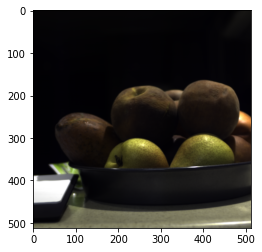

In [ ]:
img = x[3].permute(1,2,0)
plt.imshow(y[3].cpu())

In [ ]:
import numpy as np
import warnings


class XYZ_TO_SRGB:
    def __init__(self, LIN_RGB_MATRIX=None):
        if LIN_RGB_MATRIX is not None:
            self.LIN_RGB_MATRIX = LIN_RGB_MATRIX
        else:
            self.LIN_RGB_MATRIX = np.array(
                [
                    [3.2404542, -1.5371385, -0.4985314],
                    [-0.9692660, 1.8760108, 0.0415560],
                    [0.0556434, -0.2040259, 1.0572252],
                ]
            )

    def _XYZ_to_linRGB(self, xyz):
        xyz = np.array(xyz)
        return xyz @ self.LIN_RGB_MATRIX.T

    def _linRGB2sRGB(self, img):
        """
        img: float32 image [0, 1]
        """
        if img.dtype != np.float32:
            warnings.warn("ffs, use float32 not %s" % img.dtype)
        if img.min() < 0 or img.max() > 1:
            warnings.warn(
                "ffs, the range should be in [0, 1] not [%f %f]" % (img.min(), img.max())
            )

        thres = 0.0031308
        a = 0.055

        img = np.clip(img, 0, 1)

        for y in range(0, img.shape[0], 64):
            for x in range(0, img.shape[1], 64):
                s = slice(y, y + 64), slice(x, x + 64)
                fragment = img[s]
                low = fragment <= thres

                fragment[low] *= 12.92
                fragment[~low] = (1 + a) * fragment[~low] ** (1 / 2.4) - a

        return img

    def XYZ_to_sRGB(self, xyz):
        lin = self._XYZ_to_linRGB(xyz)
        return self._linRGB2sRGB(lin)

<ipython-input-15-f1858b046232>:27: UserWarning: ffs, use float32 not float64
  warnings.warn("ffs, use float32 not %s" % img.dtype)
<ipython-input-15-f1858b046232>:29: UserWarning: ffs, the range should be in [0, 1] not [-0.296896 1.163845]
  warnings.warn(


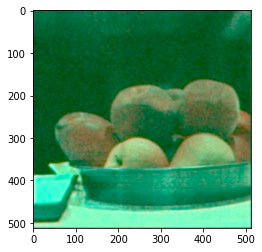

In [ ]:
SRGB = XYZ_TO_SRGB()
plt.imshow(SRGB.XYZ_to_sRGB(x[3].detach().cpu().permute(1,2,0)))

<ipython-input-15-f1858b046232>:27: UserWarning: ffs, use float32 not float64
  warnings.warn("ffs, use float32 not %s" % img.dtype)
<ipython-input-15-f1858b046232>:29: UserWarning: ffs, the range should be in [0, 1] not [-0.003138 3.211588]
  warnings.warn(


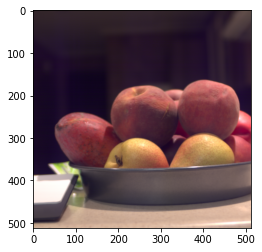

In [ ]:
plt.imshow(SRGB.XYZ_to_sRGB(y[3].cpu()))

In [ ]:
import pickle
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

lin_model = pickle.load(open('linreg.sav', 'rb'))

In [ ]:
poly = pickle.load(open('poly.sav', 'rb'))

In [ ]:
img_to_transform = poly.transform(img.reshape(-1, 3))

In [ ]:
deno

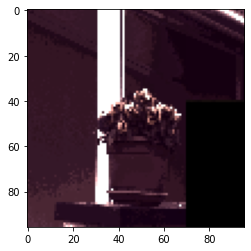

In [ ]:
plt.imshow(img_transformed)

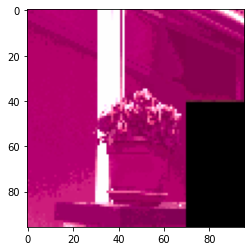

In [ ]:
plt.imshow(SRGB.XYZ_to_sRGB(img_transformed))